***** Menu *****
Please choose one filter: 
[1] Vintage
[2] Black & White
[3] HDR
[4] X-Pro II
[5] Exit
1
                                              ***** Vintage Filter *****


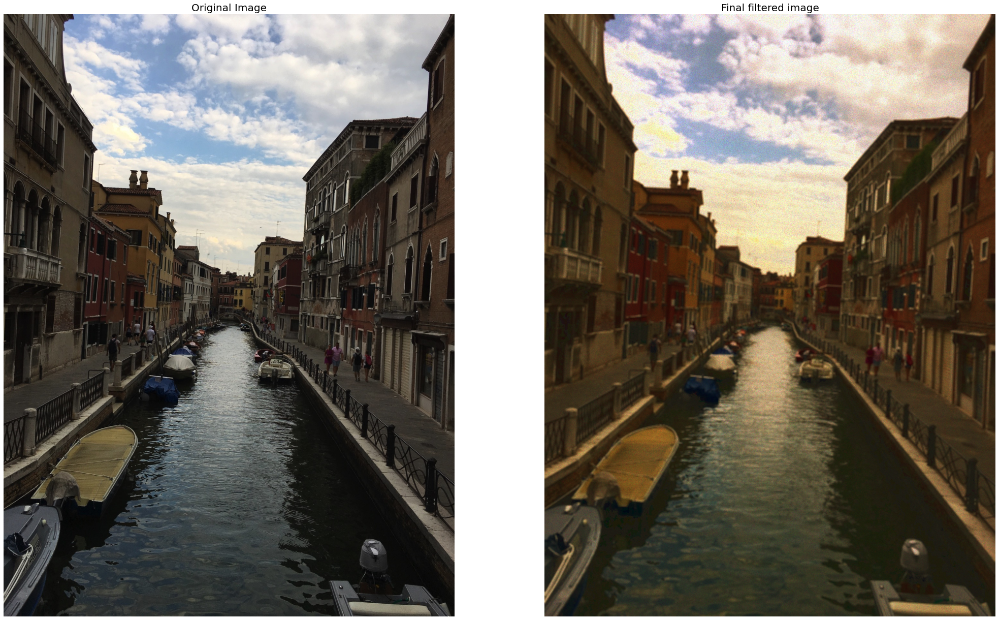

***** Menu *****
Please choose one filter: 
[1] Vintage
[2] Black & White
[3] HDR
[4] X-Pro II
[5] Exit
2
                                             ***** Black & White Filter *****


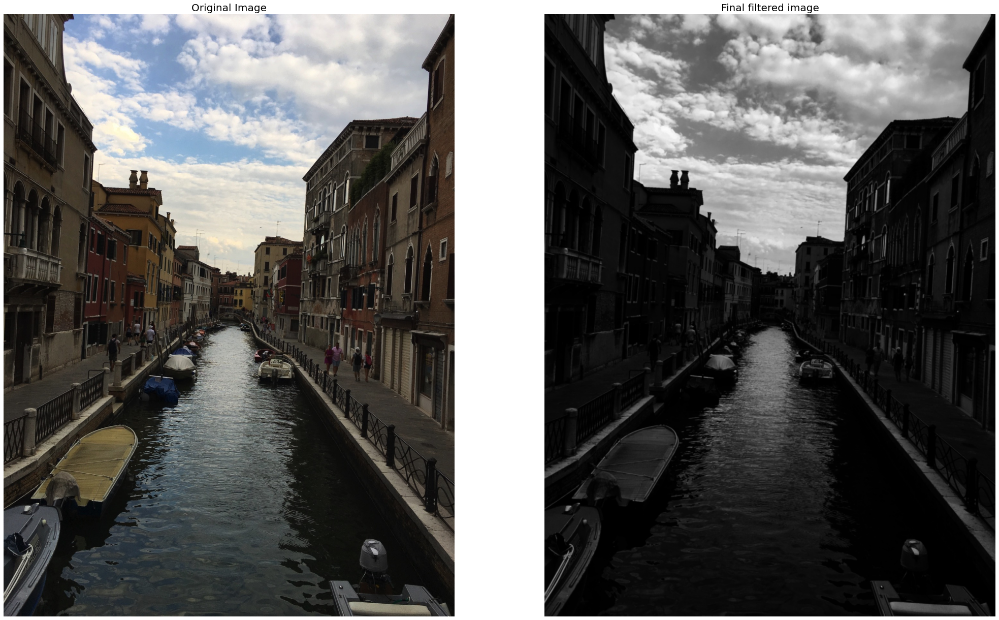

***** Menu *****
Please choose one filter: 
[1] Vintage
[2] Black & White
[3] HDR
[4] X-Pro II
[5] Exit
3
                                              ***** HDR Filter *****


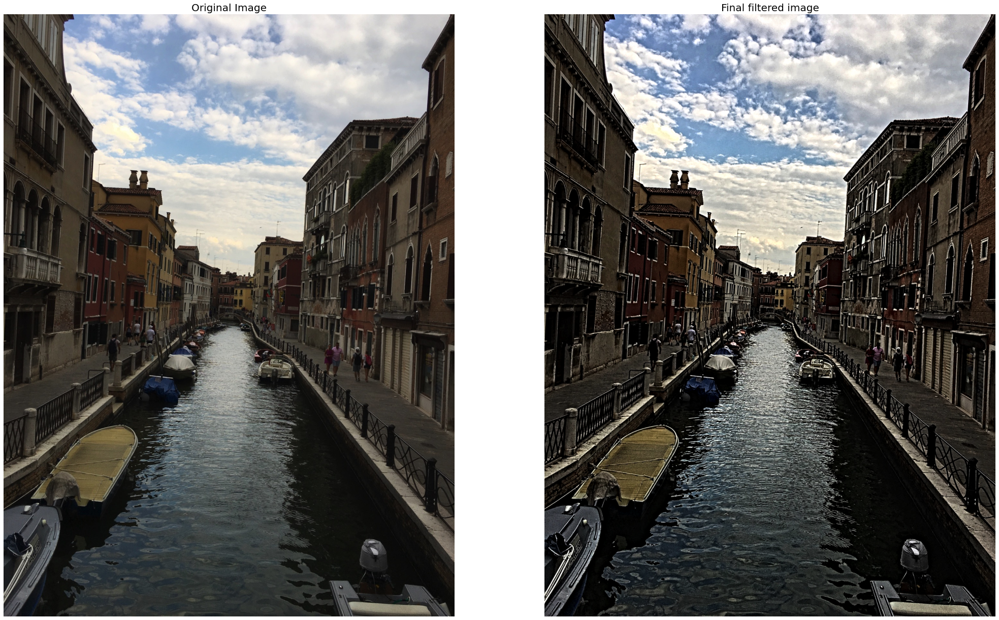

***** Menu *****
Please choose one filter: 
[1] Vintage
[2] Black & White
[3] HDR
[4] X-Pro II
[5] Exit
4
                                              ***** X-Pro II Filter *****


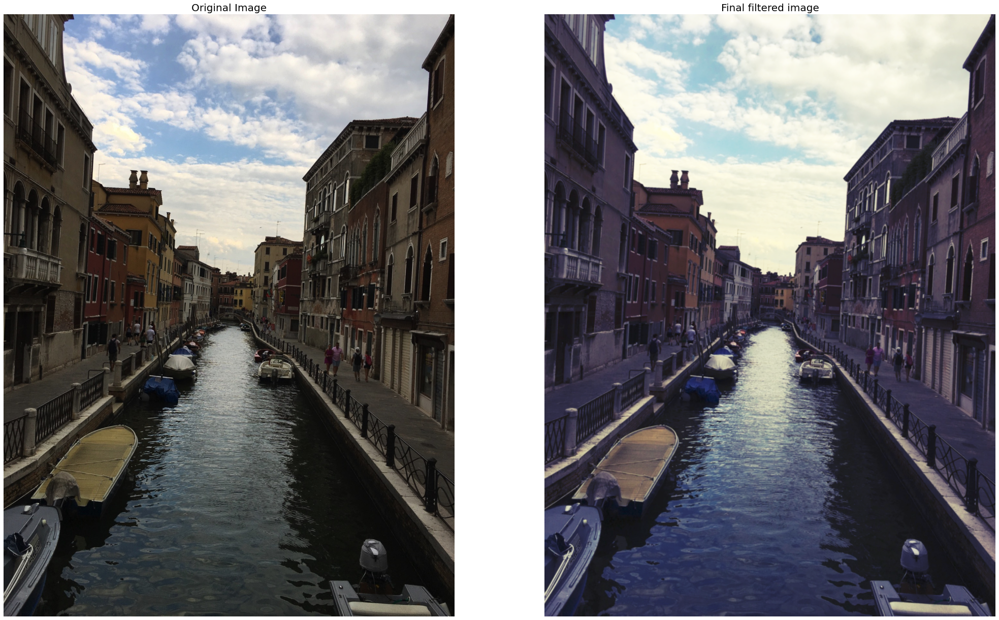

***** Menu *****
Please choose one filter: 
[1] Vintage
[2] Black & White
[3] HDR
[4] X-Pro II
[5] Exit
5
End of the program.


In [1]:
# Import the Libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.interpolate import UnivariateSpline
from skimage.util import random_noise
# Functions
def plot_image(image, title=''):
    '''Function for plotting image.

       Arguments: 
              image: The image to plot it.
              title(optional): A title to appear with the plotted image.
       
    '''
    
    plt.title(title, size=20)
    if len(image.shape) != 3: # GRAYSCALE IMAGE 
        plt.imshow(image, cmap='gray')
    else:# COLORED IMAGE
        image= cv2.cvtColor(image,cv2.COLOR_BGR2RGB) 
        plt.imshow(image)
    plt.axis('off')

def increase_brightness(image, value=30):
    '''Function to increase the brightness.
       Arguments: 
              image: The image to increase its brightness.
              value (optional): A number indicating how mush to change the value of Value that affect the brightness.
       Returns:
           image: The input image after increasing the brightness.
       
    '''
    # Convert image to HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    # Split Hue, Saturation, and Value
    h, s, v = cv2.split(hsv)
    # Increasing the value-> increasing the brightness of the color
    lim = 255 - value
    v[v > lim] = 255
    v[v <= lim] += value
    # Merge to be hsv image
    final_hsv = cv2.merge((h, s, v)) 
    # Convert image from HSV back to BGR
    image = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)
    
    return image 

def applyWarm(image):
    '''Function to apply the warm effect
       Arguments: 
              image: The image to apply to it the warm effect.
       Returns:
           image_final: Copy of input image with the Warm filter applied.
       
    '''
    
    # Take each channels values from the image
    blue_channel, green_channel, red_channel  = cv2.split(image)
    
    # Increase red channel intensity using the increase lookuptable
    red_channel = cv2.LUT(red_channel, increase_table).astype(np.uint8)
    
    # Decrease blue channel intensity using the decrease lookuptable
    blue_channel = cv2.LUT(blue_channel, decrease_table).astype(np.uint8)
    
    # Merge the channels again
    image_final = cv2.merge((blue_channel, green_channel, red_channel))
    
    return image_final

def applyGrayScale(image):
    '''Function to create grayscale image.
    Arguments:
        image:  The image to be grayscale image.
    Returns:
        image_final: Copy of the input image with the Grayscale filter applied. 
    '''
    
    # Convert the image into the grayscale
    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Make the image has three channels by combining the grayscale channel (one channel) three times
    image_final = cv2.merge((img_gray, img_gray, img_gray))
    
    return image_final


def applyXPro(image):
    ''' Function to apply the X-Pro II effect
    Arguments:
        image: The image on which the filter is to be applied.
    Returns:
        image_final: Copy of input image with the X-Pro II  applied.
       
    '''

     # Take each channels values from the image
    blue_channel, green_channel, red_channel = cv2.split(image)
    
    # Decrease the first half of the intensities values(0, 128) 
    # and increase the intensities values for other half (128, 255) for each channel
    red_channel = cv2.LUT(red_channel, decrease_increase).astype(np.uint8)
    green_channel = cv2.LUT(green_channel, decrease_increase).astype(np.uint8)
    blue_channe = cv2.LUT(blue_channel, decrease_increase).astype(np.uint8)
    
    # Merge the channels again
    image_final = cv2.merge((blue_channel, green_channel, red_channel))
    
    return image_final

def normalize8(image):
    '''Function to convert float64 image to uint8 image.
    
       Arguments: 
            image: Image with data type as float64.
       Returns:
            image: The input image with data type as uint8.
           
    '''
    mn = image.min()
    mx = image.max()
    mx -= mn

    image = ((image - mn)/mx) * 255
    return np.round(image).astype(np.uint8)
path = "images/sample2.jpg" # Path of the image
img = cv2.imread(path) # Read the image

while (True):
    choice = int(input("***** Menu *****\nPlease choose one filter: \n[1] Vintage\n[2] Black & White\n[3] HDR\n[4] X-Pro II\n[5] Exit\n"))
    
    
    if (choice==1):#Vintage
        # Lookuptable for increasing pixel values to be used for red channel, array range [0-255]
        increase_table = UnivariateSpline(x=[0, 64, 128, 255], y=[0, 75, 155, 255])(range(256))
        # Lookuptable for decreasing pixel values to be used for blue channel, array range [0-255]
        decrease_table = UnivariateSpline(x=[0, 64, 128, 255], y=[0, 45, 95, 255])(range(256))
        
        #[1] Enhance the contrast using power-law tranform 
        gamma = 1.4
        img_gamma = np.array(255*(img / 255) ** gamma, dtype = 'uint8')
        
        #[2] Blur the image using median bluring
        blur_med =cv2.blur(img_gamma, (7, 7))
        
        #[3] increase the brightness 
        bright = increase_brightness(blur_med, value=25)
        
        # [4] Apply Warm effect
        warmed= applyWarm(bright)
        
        # [5] Add noise effect with speckle noise
        img_noise = random_noise(warmed, mode='speckle', clip=True) #clip is True to keep the image data range
        
        # Convert float64 image to uint8 image
        img_final = normalize8(img_noise)
        print(" "*46+"***** Vintage Filter *****")
        
    elif (choice==2):#Black & White
        # [1] Grayscale image
        img_gray = applyGrayScale(img)
        
        #[2] change the contrast using power-law tranform 
        gamma = 1.9
        img_gamma = np.array(255*(img_gray / 255) ** gamma, dtype = 'uint8')
        
        # [3] Blur the image using Gaussian Blur
        img_final = cv2.GaussianBlur(img_gamma, (5, 5), 0)
        print(" "*45+"***** Black & White Filter *****")

    elif (choice==3):#HDR
        # [1] Make the structure more detailed
        img_detailed = cv2.detailEnhance(img, sigma_s=12, sigma_r=0.15)
        
        # [2] Change the contrast using power-law tranform 
        gamma = 1.2
        img_final = np.array(255*(img_detailed / 255) ** gamma, dtype = 'uint8')
        print(" "*46+"***** HDR Filter *****")
        
    elif (choice==4):#X-Pro II
        # Lookuptable for decreasing pixel values (0,128) and increasing pixel values (128, 255), array range [0-255]
        decrease_increase = UnivariateSpline(x=[0, 25, 51, 76, 102, 128, 153, 178, 204, 229, 255],
                                                     y=[0, 15, 24, 48, 80, 128, 180, 205, 230, 245, 255])(range(256))
        # [1] Apply X-Pro II effect
        img_edited= applyXPro(img)
        
        # [2] Change the contrast using power-law tranform 
        gamma = 0.7
        img_gamma = np.array(255*(img_edited / 255) ** gamma, dtype = 'uint8')
        
        # [3] Blur the image using Gaussian Blur
        img_final = cv2.GaussianBlur(img_gamma, (5, 5), 0)
        print(" "*46+"***** X-Pro II Filter *****")
        
    elif (choice==5):# Exit
        print("End of the program.")
        break;
        
    else:# Invalid number input
        print(" "*46+"Invalid choice number!")
        continue
        
    # Plot the images  
    plt.figure(figsize=(35,25))
    plt.subplot(121), plot_image(img,'Original Image')
    plt.subplot(122), plot_image(img_final,'Final filtered image')
    plt.show()
    

